# Шаг 1. Выбор датасета. Постановка задачи.

Рассматриваются данные датасета [Rice type classification](https://www.kaggle.com/datasets/mssmartypants/rice-type-classification/). Требуется решить задачу бинарной классификации риса. Нужно отличить сорт Жасмин от сорта Гонен.

Небольшая справка из wiki:

<b>Жасминовый</b> рис (тайск. ข้าวหอมมะลิ) — длиннозернистый сорт риса, также известный как ароматный рис. Разновидность посевного риса. Жасминовый рис выращивается в основном в Таиланде, Камбодже, Лаосе и на юге Вьетнама.

<b>Гонен</b> (тур. Gönen) — муниципалитет и район в провинции Балыкесир , Турция . Он расположен в южной части Мраморного моря . Город в основном известен своими лечебными горячими источниками , обработкой кожи и производством <b>риса.</b>

![Иллюстрация к проекту](dataset-cover.jpg)

## Описание датасета

Это набор данных, созданный для классификации риса. В нем собранны метрические характеристики 18185 зерен двух сортов риса: Жасмин - класс 1, Гонен - класс 0.

Набор признаков (10 штук) в колонках:
1. Area (Площадь)
2. MajorAxisLength (Большой диаметр)
3. MinorAxisLength (Малый диаметр)
4. Eccentricity (Эксцентриситет)
5. ConvexArea (Выпуклая площадь)
6. EquivDiameter (Приведенный диаметр)
7. Extent (Объем)
8. Perimeter (Периметр)
9. Roundness (Округлость)
10. AspectRation (Соотношение сторон)

Целевая переменная (класс) в колонке:
- Class

##  Установка и импорт библиотек

In [1]:
!pip install mlxtend

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression as lr
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn import metrics
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from mlxtend.plotting import plot_confusion_matrix

In [3]:
import warnings
warnings.filterwarnings('ignore')

# Шаг 2. Предварительная обработка.

### Загрузим данные

In [4]:
df = pd.read_csv('riceClassification.csv')

In [5]:
df

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...,...
18180,18181,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,18182,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,18183,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,18184,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


### Все данные числовые и `null` значений в датафрейме нет.

In [7]:
df.describe()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000
mean,9093.000000,7036.492989,151.680754,59.807851,0.915406,7225.817872,94.132952,0.616653,351.606949,0.707998,2.599081,0.549079
std,5249.701658,1467.197150,12.376402,10.061653,0.030575,1502.006571,9.906250,0.104389,29.500620,0.067310,0.434836,0.497599
min,1.000000,2522.000000,74.133114,34.409894,0.676647,2579.000000,56.666658,0.383239,197.015000,0.174590,1.358128,0.000000
25%,4547.000000,5962.000000,145.675910,51.393151,0.891617,6125.000000,87.126656,0.538530,333.990000,0.650962,2.208527,0.000000
50%,9093.000000,6660.000000,153.883750,55.724288,0.923259,6843.000000,92.085696,0.601194,353.088000,0.701941,2.602966,1.000000
75%,13639.000000,8423.000000,160.056214,70.156593,0.941372,8645.000000,103.559146,0.695664,373.003000,0.769280,2.964101,1.000000
max,18185.000000,10210.000000,183.211434,82.550762,0.966774,11008.000000,114.016559,0.886573,508.511000,0.904748,3.911845,1.000000


### В строке `min` все величины > 0, поэтому нулевых значений тоже нет. Можно заключить, что в датасете нет пропусков.

### Удалим колнку `id` (в ней нет полезной информации)

In [8]:
df = df.drop(columns=['id'])

### Проверим наличие дубликатов.

In [9]:
df.duplicated().sum()

0

### Дубликатов нет.

### Проанализируем данные на наличие выбросов.

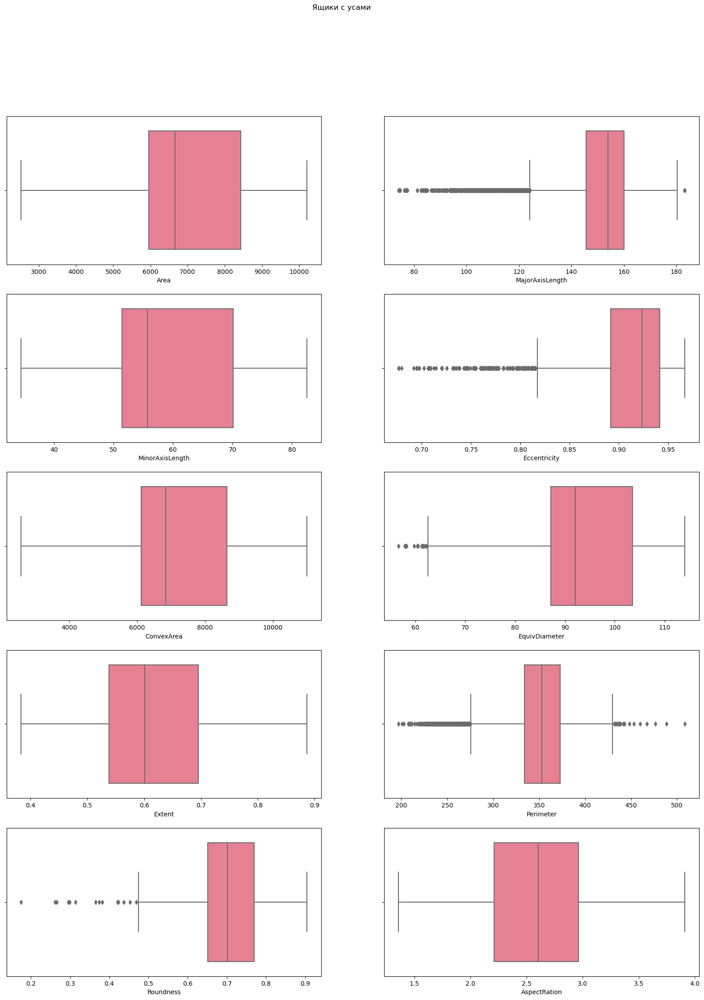

In [10]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Ящики с усами')
col = 0
for i in range(5):
    for j in range(2):
        sns.boxplot(ax=axes[i,j], data=df, x=df.columns[col], palette="husl")
        col += 1

### Исключим выбросы из датасета

In [11]:
# вычислим межквартильный размах
def iqr_calculation(main_df,col):
    Q1 = np.percentile(col,25,interpolation = 'midpoint')
    Q3 = np.percentile(col,75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    upper = np.where(col>=(Q3+1.5*IQR))
    lower = np.where(col<=(Q1-1.5*IQR))
    return upper,lower

# удалим выбросы
def remove_outliers(main_df,upper,lower):
    main_df.drop(upper[0], inplace = True)
    main_df.drop(lower[0], inplace = True)
    print("Новые размеры: ", main_df.shape)
    return main_df

# перестроим индекс
def reset_dataframe(main_df):
    main_df.reset_index(inplace=True)
    main_df.drop(columns=['index'],inplace=True)
    return main_df

In [12]:
main_df = df

for i in range(0,len(main_df.columns)-1):
    print('Для ',df.columns[i])
    upper, lower = iqr_calculation(main_df,df[df.columns[i]])
    main_df = remove_outliers(main_df,upper,lower)
    final_df = reset_dataframe(main_df)

Для  Area
Новые размеры:  (18185, 11)
Для  MajorAxisLength
Новые размеры:  (17647, 11)
Для  MinorAxisLength
Новые размеры:  (17647, 11)
Для  Eccentricity
Новые размеры:  (17631, 11)
Для  ConvexArea
Новые размеры:  (17631, 11)
Для  EquivDiameter
Новые размеры:  (17631, 11)
Для  Extent
Новые размеры:  (17631, 11)
Для  Perimeter
Новые размеры:  (17602, 11)
Для  Roundness
Новые размеры:  (17597, 11)
Для  AspectRation
Новые размеры:  (17597, 11)


In [13]:
final_df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,6374,129.576759,63.762307,0.870549,6476,90.086785,0.662234,314.656,0.809003,2.032184,1
1,6946,136.303603,65.738475,0.876009,7115,94.042128,0.594437,338.782,0.760508,2.073422,1
2,5786,125.555431,59.626250,0.880040,5945,85.831020,0.623491,307.304,0.769931,2.105707,1
3,5896,127.013995,59.843292,0.882050,6092,86.643063,0.610352,309.264,0.774655,2.122443,1
4,6082,129.098407,60.416315,0.883736,6204,87.999107,0.661375,308.106,0.805111,2.136814,1
...,...,...,...,...,...,...,...,...,...,...,...
17592,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
17593,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
17594,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
17595,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


# Шаг 3 Создание новых признаков / Feature Engineering

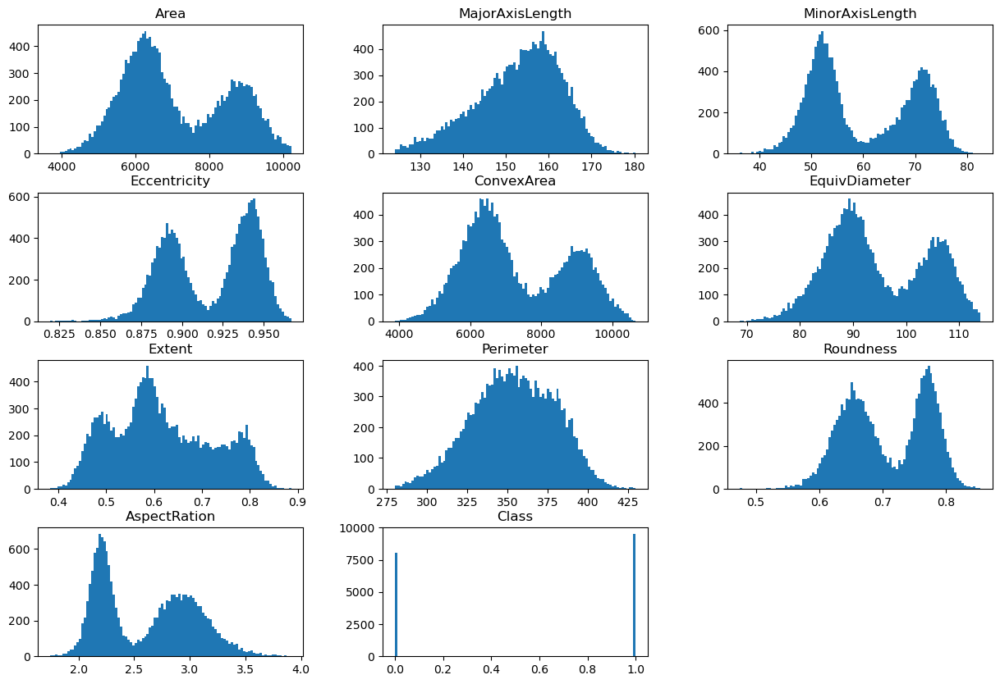

In [14]:
final_df.hist(grid=False, figsize=(15,10), bins=100);

### Бросается в глаза двухмодальность распределения ряда признаков. Поэтому можно ввести дополнительные бинарные признаки: `Area_type`, `MinorAxisLength_type`, `Eccentricity_type` и др.

In [15]:
final_df['Area_type'] = final_df.Area.apply(lambda x: int(x > 7500))
final_df['MinorAxisLength_type'] = final_df.MinorAxisLength.apply(lambda x: int(x > 60))
final_df['Eccentricity_type'] = final_df.Eccentricity.apply(lambda x: int(x > 0.91))
final_df['ConvexArea_type'] = final_df.ConvexArea.apply(lambda x: int(x > 7500))
final_df['EquivDiameter_type'] = final_df.EquivDiameter.apply(lambda x: int(x > 98))
final_df['Roundness_type'] = final_df.Roundness.apply(lambda x: int(x > 0.72))
final_df['AspectRation_type'] = final_df.AspectRation.apply(lambda x: int(x > 2.5))

### Добавим еще 3  формульных признака: `F1 = Extent * ConvexArea`, `F2 = Perimeter * Roundness`, `F3 = Eccentricity * Area`

In [16]:
final_df['F1']  = final_df.Extent * final_df.ConvexArea
final_df['F2']  = final_df.Perimeter * final_df.Roundness
final_df['F3']  = final_df.Eccentricity * final_df.Area

In [17]:
final_df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,...,Area_type,MinorAxisLength_type,Eccentricity_type,ConvexArea_type,EquivDiameter_type,Roundness_type,AspectRation_type,F1,F2,F3
0,6374,129.576759,63.762307,0.870549,6476,90.086785,0.662234,314.656,0.809003,2.032184,...,0,1,0,0,0,1,0,4288.625870,254.557505,5548.880719
1,6946,136.303603,65.738475,0.876009,7115,94.042128,0.594437,338.782,0.760508,2.073422,...,0,1,0,0,0,1,0,4229.421481,257.646541,6084.759565
2,5786,125.555431,59.626250,0.880040,5945,85.831020,0.623491,307.304,0.769931,2.105707,...,0,0,0,0,0,1,0,3706.656250,236.602909,5091.910674
3,5896,127.013995,59.843292,0.882050,6092,86.643063,0.610352,309.264,0.774655,2.122443,...,0,0,0,0,0,1,0,3718.264182,239.573055,5200.569023
4,6082,129.098407,60.416315,0.883736,6204,87.999107,0.661375,308.106,0.805111,2.136814,...,0,1,0,0,0,1,0,4103.167464,248.059649,5374.879931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17592,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,...,0,0,1,0,0,0,1,2995.555328,220.900310,5497.195546
17593,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,...,1,0,1,1,1,0,1,5054.076825,247.248865,7125.333838
17594,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,...,0,0,1,0,0,0,1,3665.768519,233.701236,5981.574412
17595,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,...,0,0,1,0,0,0,1,3047.458692,218.118504,5604.945479


# Шаг 4 Разведочный анализ данных / Exploratory Data Analysis (EDA)

### Насколько классы сбалансированы?

In [18]:
final_df.Class.value_counts(normalize=True).mul(100).round(1).astype(str) + '%'

Class
1    54.2%
0    45.8%
Name: proportion, dtype: object

### Есть небольшое смещение в пользу класса 1

### Посмотрим на корреляции признаков

In [19]:
final_df.corr()

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,...,Area_type,MinorAxisLength_type,Eccentricity_type,ConvexArea_type,EquivDiameter_type,Roundness_type,AspectRation_type,F1,F2,F3
Area,1.000000,0.556507,0.951211,-0.749522,0.999407,0.998876,0.258960,0.892420,0.725444,-0.739179,...,0.889841,0.849095,-0.809258,0.889015,0.889468,0.783410,-0.808343,0.841217,0.973273,0.993835
MajorAxisLength,0.556507,1.000000,0.279787,0.111965,0.559291,0.562474,-0.050036,0.841910,-0.119066,0.135959,...,0.359015,0.152242,-0.082390,0.346916,0.365389,0.057777,-0.071028,0.361655,0.371230,0.640686
MinorAxisLength,0.951211,0.279787,1.000000,-0.915051,0.949925,0.950351,0.316545,0.727901,0.881515,-0.906486,...,0.887736,0.928207,-0.908585,0.893861,0.884410,0.885695,-0.910511,0.838278,0.989368,0.912451
Eccentricity,-0.749522,0.111965,-0.915051,1.000000,-0.746944,-0.748271,-0.343474,-0.411604,-0.950974,0.977584,...,-0.754477,-0.900385,0.912097,-0.768614,-0.747709,-0.894755,0.914943,-0.711991,-0.864356,-0.672857
ConvexArea,0.999407,0.559291,0.949925,-0.746944,1.000000,0.998186,0.255959,0.897143,0.716595,-0.736563,...,0.889349,0.846770,-0.806746,0.888778,0.889066,0.778675,-0.805692,0.839883,0.969795,0.993548
EquivDiameter,0.998876,0.562474,0.950351,-0.748271,0.998186,1.000000,0.258380,0.896097,0.724151,-0.738347,...,0.880518,0.846845,-0.806542,0.881676,0.879779,0.780973,-0.805910,0.839239,0.972946,0.993496
Extent,0.258960,-0.050036,0.316545,-0.343474,0.255959,0.258380,1.000000,0.117830,0.364365,-0.348217,...,0.263740,0.309881,-0.312031,0.268742,0.260781,0.315640,-0.317394,0.730322,0.310404,0.233384
Perimeter,0.892420,0.841910,0.727901,-0.411604,0.897143,0.896097,0.117830,1.000000,0.344166,-0.390225,...,0.715402,0.594117,-0.535137,0.713560,0.718175,0.487474,-0.528485,0.690334,0.769495,0.929786
Roundness,0.725444,-0.119066,0.881515,-0.950974,0.716595,0.724151,0.364365,0.344166,1.000000,-0.959462,...,0.739564,0.871580,-0.879972,0.747903,0.733213,0.900301,-0.889518,0.701553,0.863280,0.655424
AspectRation,-0.739179,0.135959,-0.906486,0.977584,-0.736563,-0.738347,-0.348217,-0.390225,-0.959462,1.000000,...,-0.740521,-0.873826,0.881498,-0.754097,-0.734399,-0.873635,0.893567,-0.705025,-0.858977,-0.667098


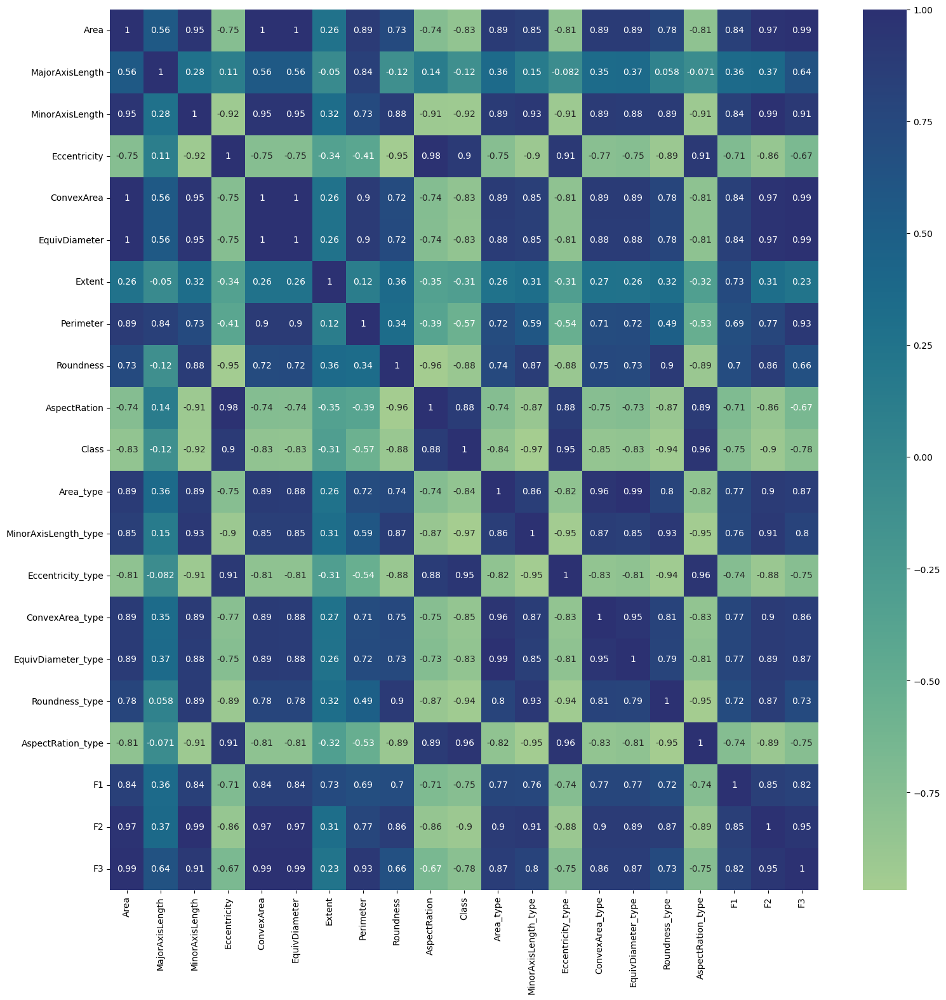

In [20]:
correlation_mat = final_df.corr()
corr_features = correlation_mat.index
plt.figure(figsize=(18,18))
g = sns.heatmap(final_df[corr_features].corr(), annot=True, cmap="crest")
plt.show()

#### Наблюдается мультиколлиниарность признаков. Имеет смысл исключить некоторые из них.

In [21]:
final_df = final_df.drop(['Area', 'F2', 'ConvexArea', 'EquivDiameter', 'ConvexArea_type', 'EquivDiameter_type'], axis = 1)

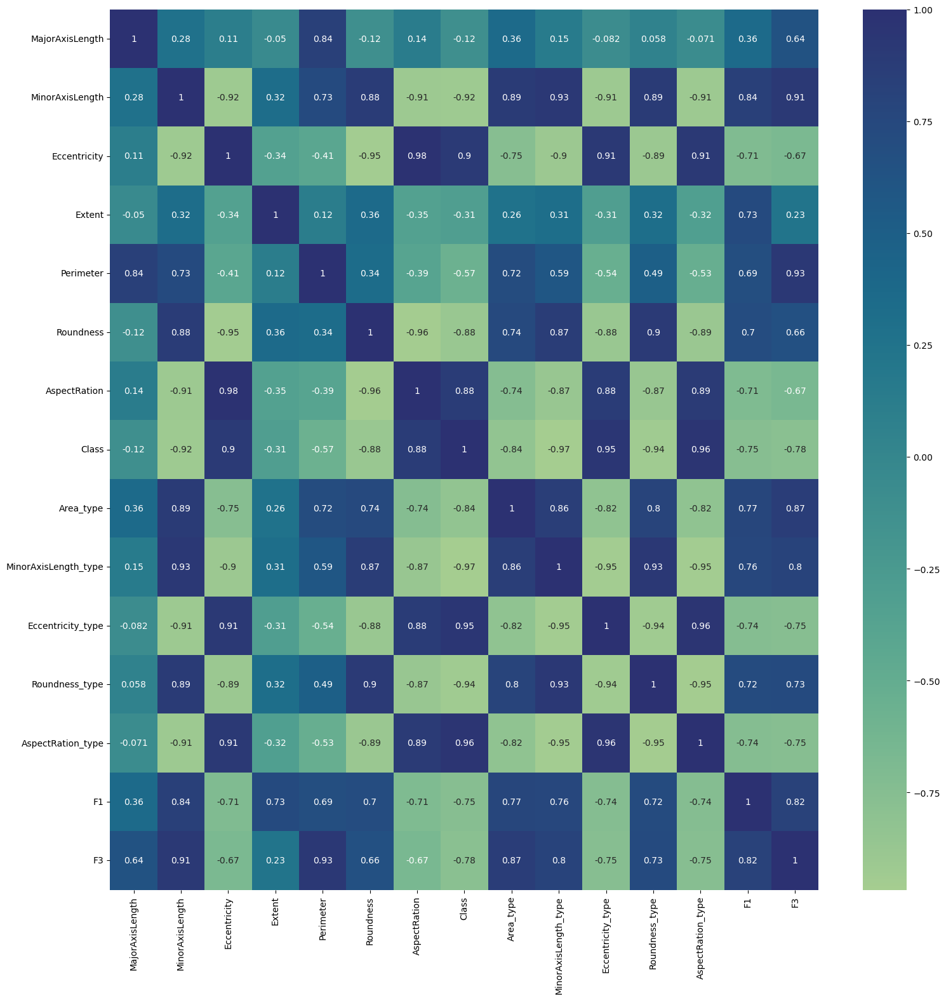

In [22]:
correlation_mat = final_df.corr()
corr_features = correlation_mat.index
plt.figure(figsize=(18,18))
g = sns.heatmap(final_df[corr_features].corr(), annot=True, cmap="crest")
plt.show()

In [23]:
final_df.shape

(17597, 15)

# Шаг 5 Визуализация

### Ящики с усами (by class)

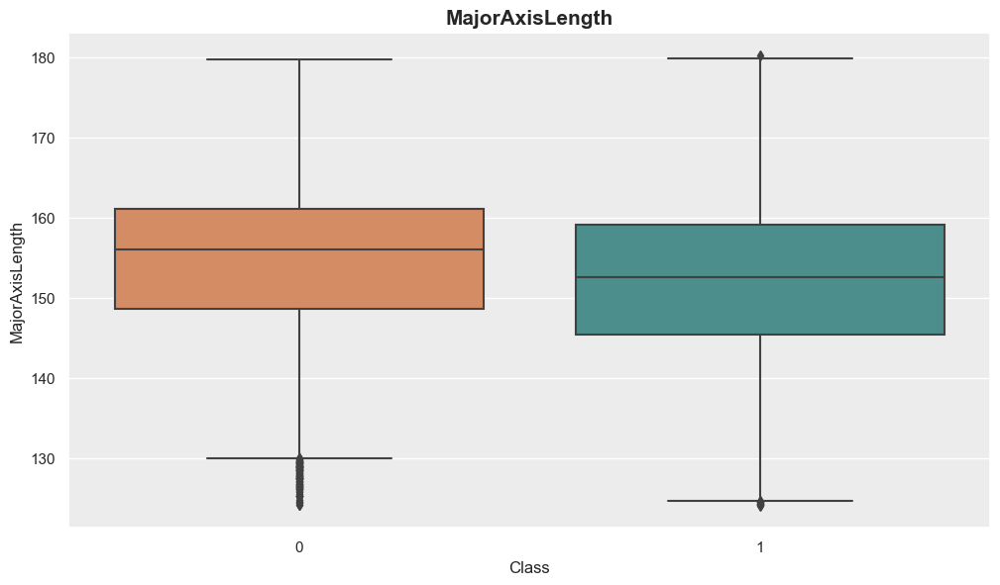

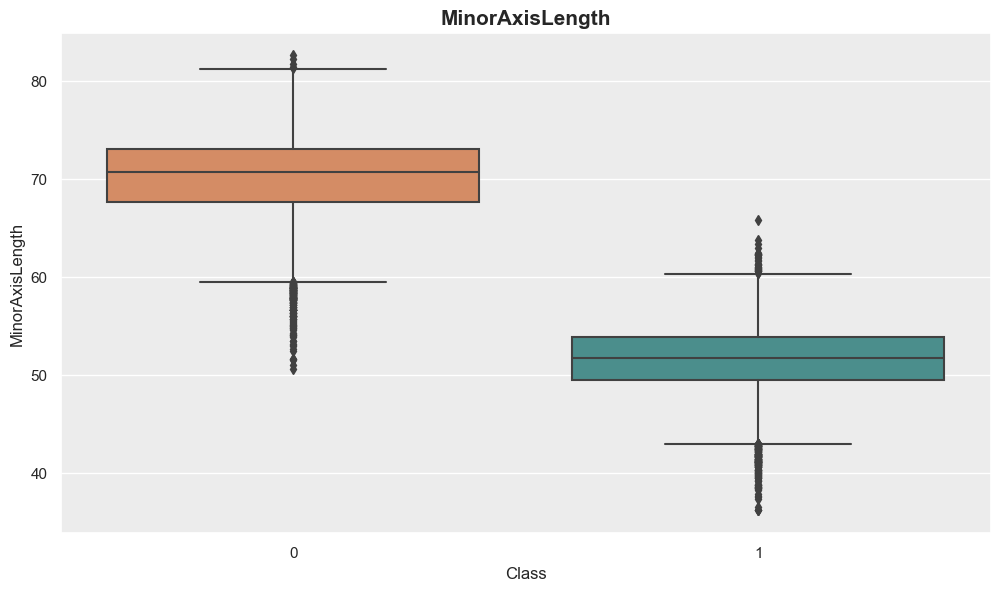

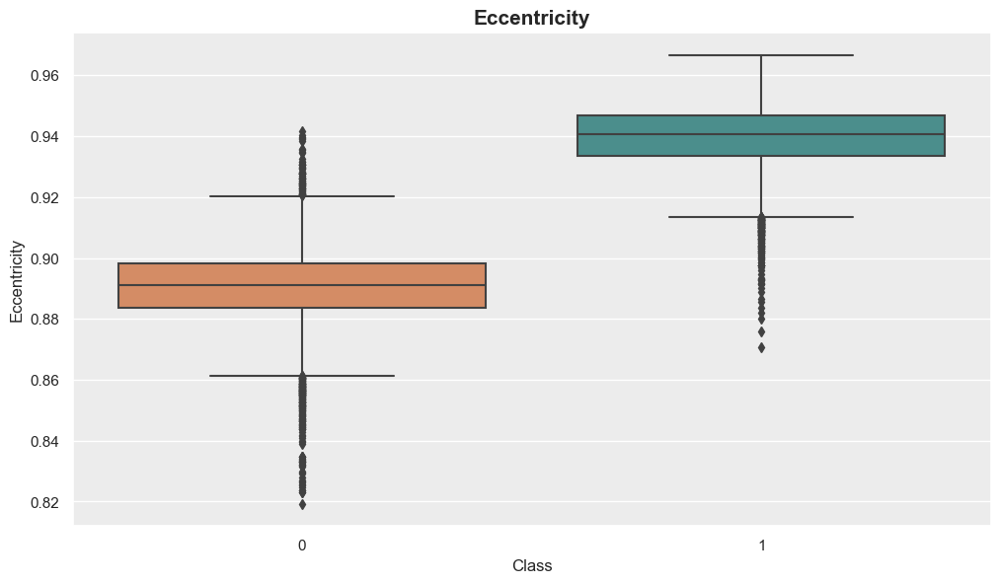

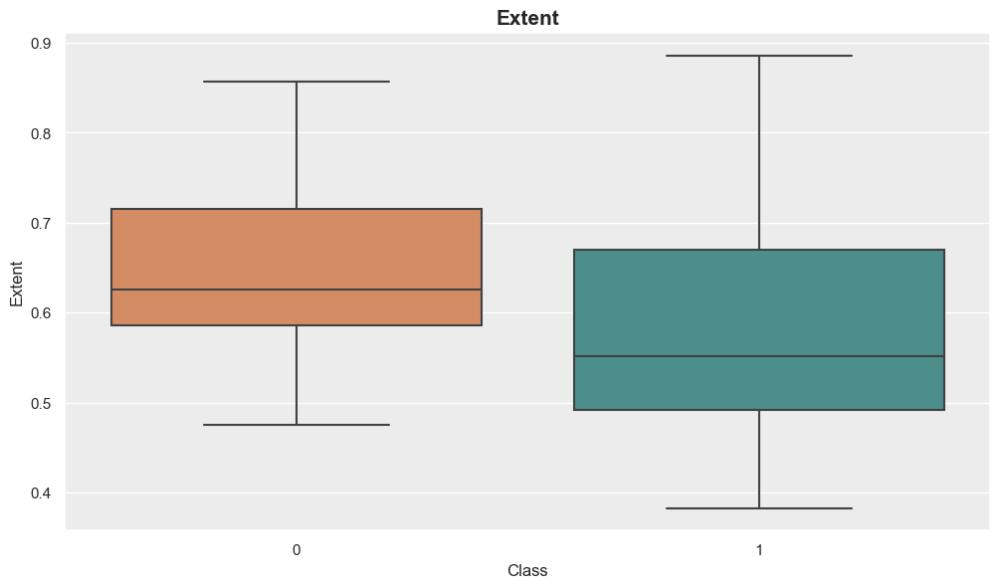

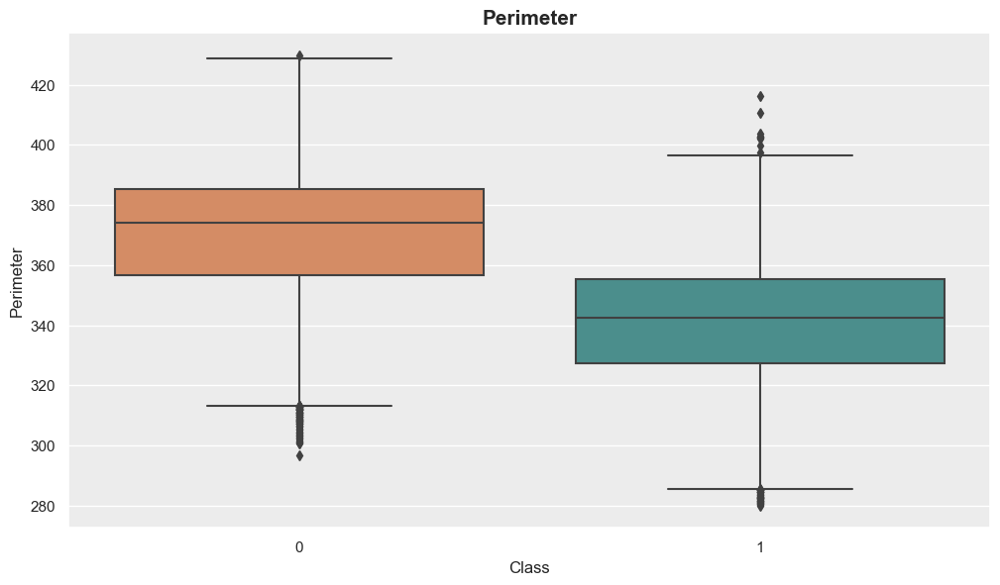

...

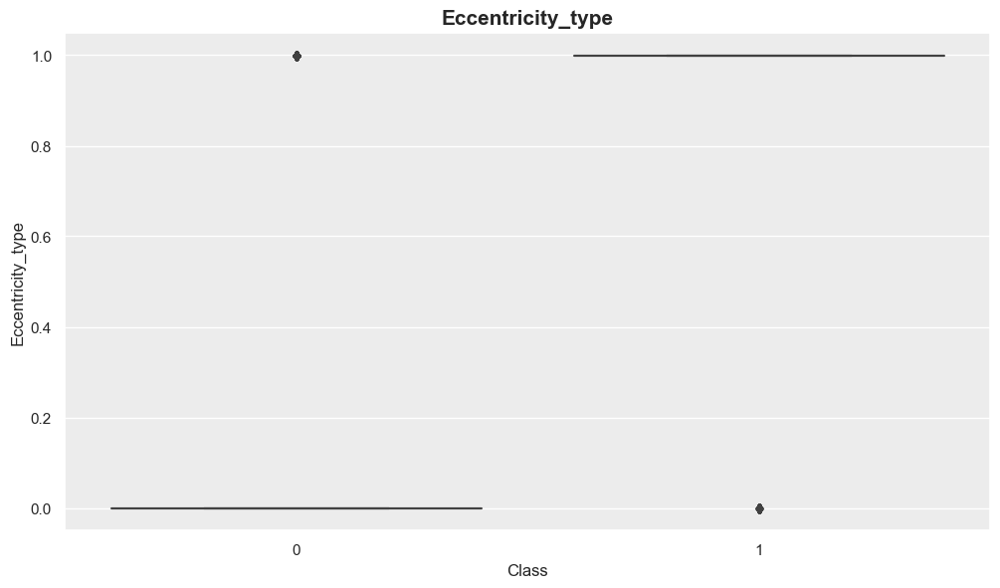

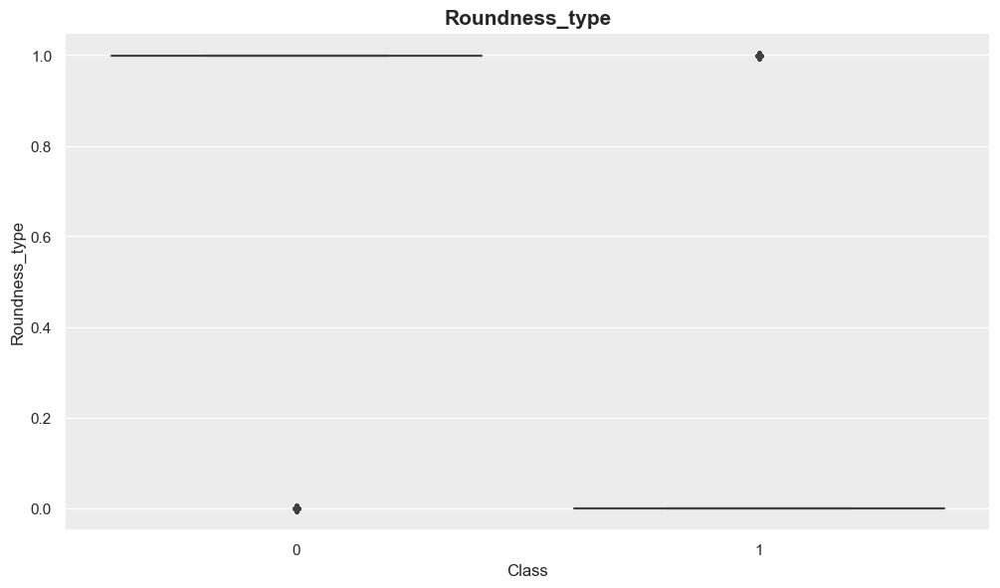

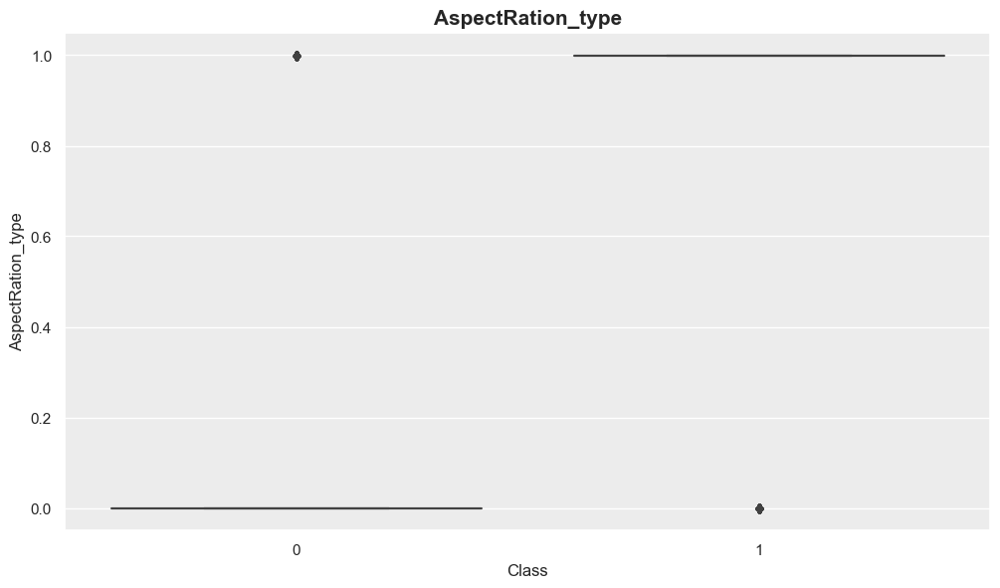

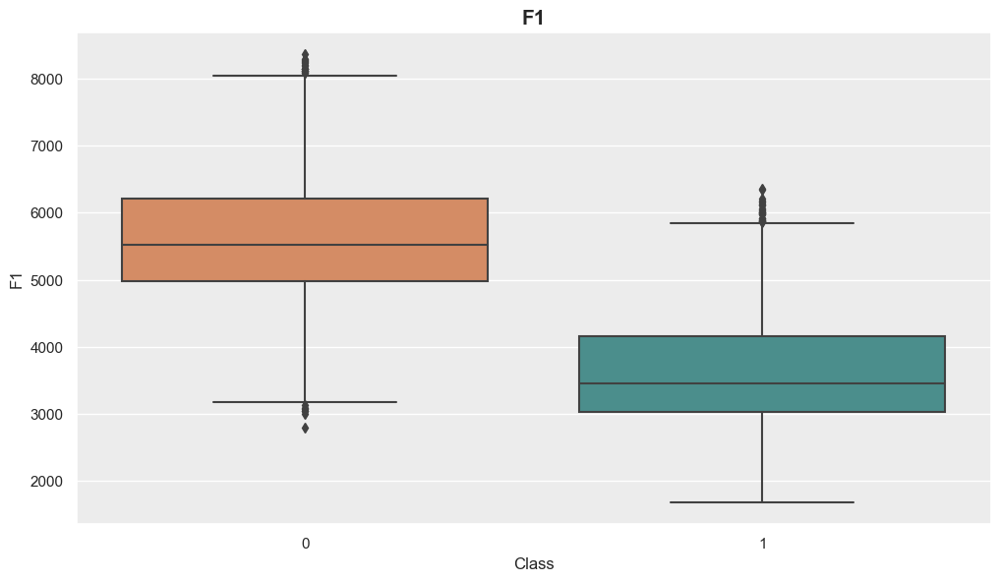

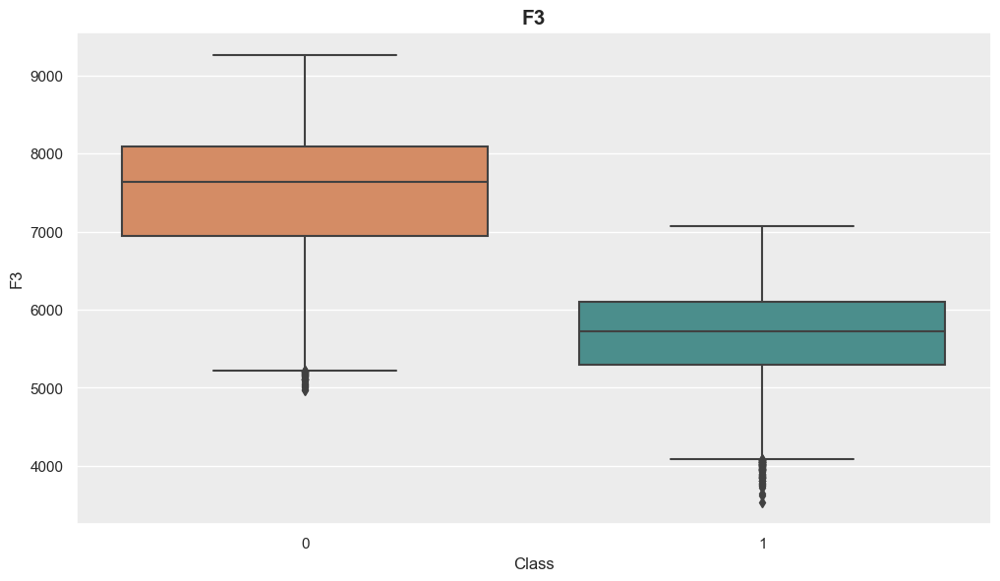

In [24]:
list_of_num_features = final_df.loc[:, final_df.columns != 'Class']
palette_features = ['#E68753', '#409996']
sns.set(rc={'axes.facecolor':'#ECECEC'})

for feature in list_of_num_features:
    plt.figure(figsize=(12, 6.5))
    plt.title(feature, fontsize=15, fontweight='bold',  ha='center')
    ax = sns.boxplot(x = final_df['Class'], y = list_of_num_features[feature], data = final_df, palette=palette_features)

    for container in ax.containers:
        ax.bar_label(container)
    plt.show()

### Violin plots

In [25]:
fig = make_subplots(rows=7, cols=2, subplot_titles=[i for i in final_df.columns])

col = 0
for i in range(1, 8):
    for j in range(1, 3):
        col_name = final_df.columns[col]
        fig.append_trace(go.Violin(y=final_df[col_name],
                                   name=col_name,
                                   box_visible=True),
                         row=i,
                         col=j)

        col += 1
fig.update_layout(template='plotly_dark',
                  height=2000,
                  width=1200,
                  title_text="Violin Plot всех признаков",
                  font_family="Times New Roman")

### Scatter matrix

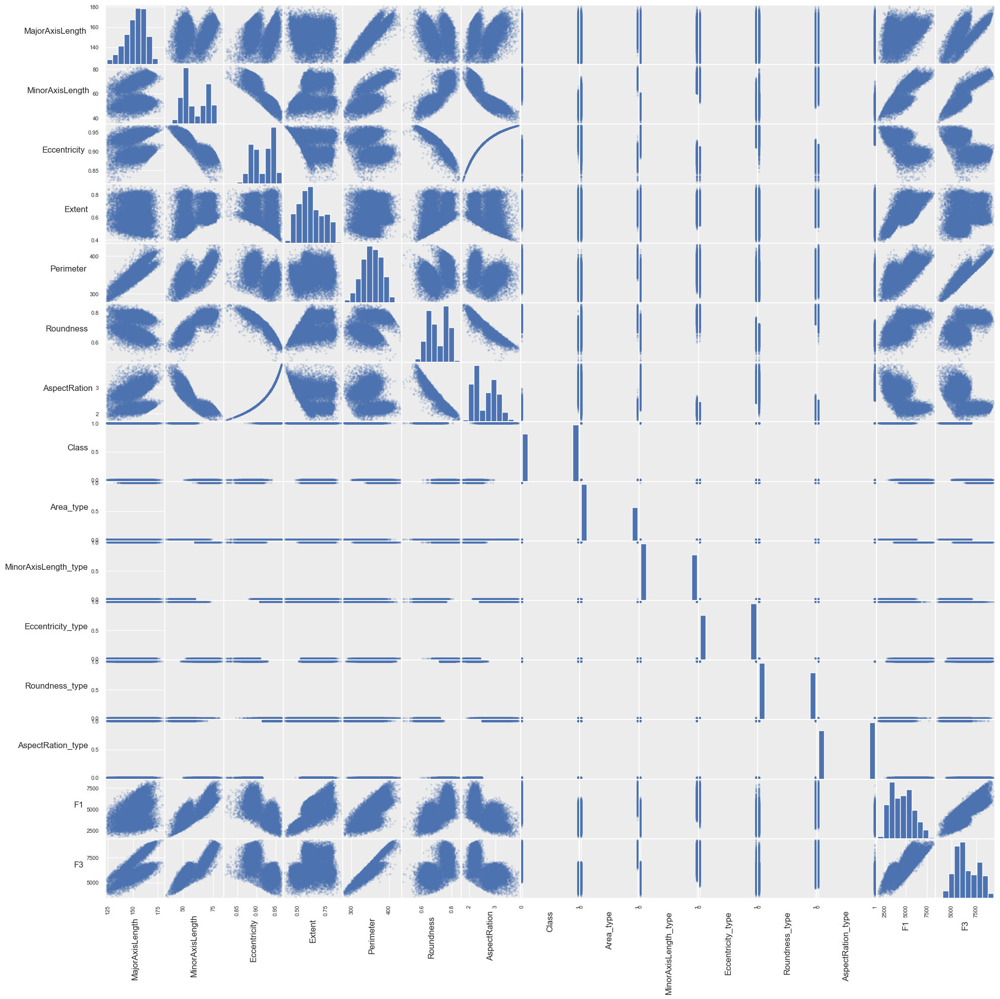

In [26]:
axes = pd.plotting.scatter_matrix(final_df, alpha=0.2, figsize=(20, 20));

for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

# Шаг 6 Машинное обучение.

## Зафиксируем случайность

In [27]:
seed = 12341092

## Разделим датасет на трейн и тест

In [28]:
y = final_df['Class']
X = final_df.drop(columns=['Class'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed)

## Отмаштабируем признаки

In [29]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled

array([[ 1.05243889, -0.4070705 ,  0.8246822 , ...,  0.92329875,
        -0.73220711,  0.11931834],
       [ 0.74583428, -0.69546041,  0.97513637, ...,  0.92329875,
         0.6875956 , -0.29324742],
       [ 0.2288334 ,  1.07834492, -0.99262917, ..., -1.08307305,
         0.68479433,  0.90947397],
       ...,
       [-0.41031577, -0.75910663,  0.6931613 , ...,  0.92329875,
        -1.16312984, -0.76942939],
       [ 0.07895515,  0.52154467, -0.42141281, ..., -1.08307305,
         1.26593299,  0.45721824],
       [-0.18493021, -0.34856684,  0.3797944 , ...,  0.92329875,
        -0.32556058, -0.3659563 ]])

In [30]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[-1.2785249 ,  0.96329623, -1.79471522, ..., -1.08307305,
         0.77144748,  0.07383996],
       [-0.21158938, -0.68798658,  0.69155686, ...,  0.92329875,
        -0.97910679, -0.63418528],
       [-1.15862869, -1.10454704,  0.77441127, ...,  0.92329875,
        -0.22844561, -1.26753455],
       ...,
       [ 1.18540092,  0.73095416, -0.16052183, ..., -1.08307305,
         0.0647382 ,  1.11320884],
       [ 0.37998342, -0.55933274,  0.7594882 , ...,  0.92329875,
        -0.79324144, -0.3143491 ],
       [-0.30357012, -0.41679328,  0.40359971, ...,  0.92329875,
        -0.25771519, -0.49659641]])

## Создадим список экспериментов

In [31]:
experiments = list()

## В качестве бейзлайна обучим байесовский классификатор. Значения метрик для него будут базовыми ориентирами.

In [32]:
def calc_metrics(y_test, y_pred, model_name, verbose=True):
    acc = metrics.accuracy_score(y_test, y_pred)
    f1 = metrics.f1_score(y_test, y_pred)
    roc_auc = metrics.roc_auc_score(y_test, y_pred)
    if verbose:
        print(model_name)
        print(f'Accuracy: {acc:.4f}')
        print(f'F1 score: {f1:.4f}')
        print(f'ROC AUC: {roc_auc:.4f}')

    return model_name, acc, f1, roc_auc

In [33]:
gnb_model = GaussianNB()
gnb_model.fit(X_train_scaled, y_train)
y_pred = gnb_model.predict(X_test_scaled)
experiments.append(calc_metrics(y_test, y_pred, 'Байесовский классификатор (baseline)'))

Байесовский классификатор (baseline)
Accuracy: 0.9895
F1 score: 0.9901
ROC AUC: 0.9896


## Попробуем другие модели для достижения более высоких значений метрик

## 1. Обучим логистическую регрессию, посмотрим на значимость признаков и подберем для нее наилучшие гиперпараметры. (далее для всех моделей будет такая же последовательность действий)

In [34]:
lr_model = lr(random_state=seed)
lr_model.fit(X_train_scaled, y_train)
y_pred = lr_model.predict(X_test_scaled)

In [35]:
experiments.append(calc_metrics(y_test, y_pred, 'Логистическая регрессия (до подбора гиперпараметров)'))

Логистическая регрессия (до подбора гиперпараметров)
Accuracy: 0.9912
F1 score: 0.9917
ROC AUC: 0.9911


In [36]:
def show_weights(features, weights):
    fig, axs = plt.subplots(figsize=(10, 5), ncols=1)
    sorted_weights = sorted(zip(weights, features), reverse=True)
    weights = [x[0] for x in sorted_weights]
    features = [x[1] for x in sorted_weights]
    sns.barplot(y=features, x=weights, ax=axs)
    axs.set_xlabel("Weight")

### Значимость признаков

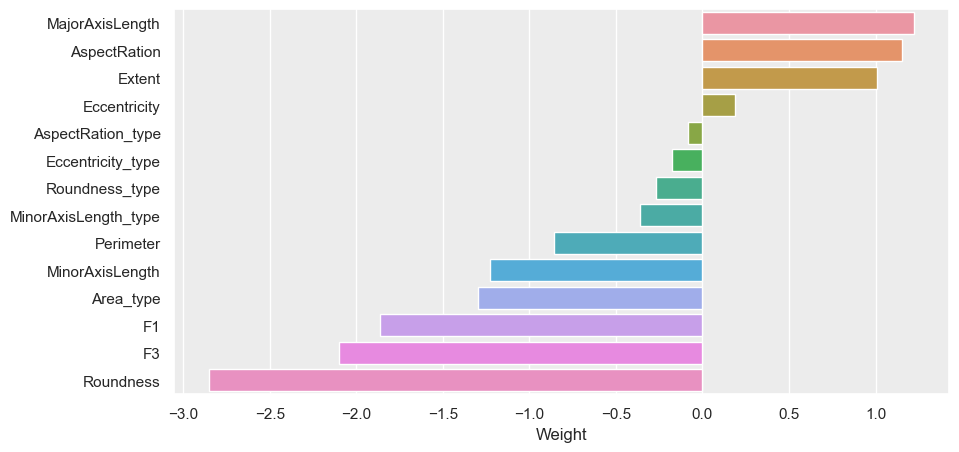

In [37]:
show_weights(X.columns.to_list(), lr_model.coef_[0])

### Найдем оптимальные гипер-параметры лог. регресссии (отбор лучших параметров будем делать по метрике ROC AUC)

In [38]:
lr_model = lr(random_state=seed)

solvers = ['newton-cg','lbfgs','liblinear']
penalty = ['l1', 'l2', 'elasticnet', None]
c_values = [100, 10, 1.0, 0.1, 0.01]

grid = dict(solver=solvers, penalty=penalty, C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=seed)
grid_search_lr = GridSearchCV(estimator=lr_model, param_grid=grid, n_jobs=-1, cv=cv, scoring='roc_auc', error_score=0)
grid_search_lr.fit(X_train_scaled, y_train)

print(grid_search_lr)
print(f"Best ROC AUC: {grid_search_lr.best_score_:.4f} using {grid_search_lr.best_params_}")

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=12341092),
             error_score=0, estimator=LogisticRegression(random_state=12341092),
             n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='roc_auc')
Best ROC AUC: 0.9991 using {'C': 100, 'penalty': None, 'solver': 'newton-cg'}


### Посмотрим на разные визуализации полученных результатов (далее для всех моделей будет следовать такой же набор)

In [39]:
y_score = grid_search_lr.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig_hist = px.histogram(x=y_score,
                        color=y_test,
                        nbins=50,
                        labels=dict(color='Истинный класс', x='Предсказанная вероятность класса 1'),
                        title='Гистограмма предсказаний')
fig_hist.show()

In [40]:
df_m = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df_m.index.name = "Порог"
df_m.columns.name = "Rate"

fig_thresh = px.line(
    df_m, title='TPR и FPR для каждого порога',
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

In [41]:
# y_score = grid_search_lr.predict_proba(X_test_scaled)[:, 1]
# fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC кривая (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(showgrid=False, scaleanchor="x", scaleratio=1)
fig.update_xaxes(showgrid=False, constrain='domain')
fig.show()

In [42]:
y_pred = grid_search_lr.predict(X_test_scaled)
experiments.append(calc_metrics(y_test, y_pred, 'Логистическая регрессия (после подбора гиперпараметров)'))

Логистическая регрессия (после подбора гиперпараметров)
Accuracy: 0.9923
F1 score: 0.9928
ROC AUC: 0.9923


### Стандартный классификационный отчет (Classification report)

In [43]:
target_names = ['class 0', 'class 1']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.99      0.99      1656
     class 1       0.99      0.99      0.99      1864

    accuracy                           0.99      3520
   macro avg       0.99      0.99      0.99      3520
weighted avg       0.99      0.99      0.99      3520



### Матрица ошибок

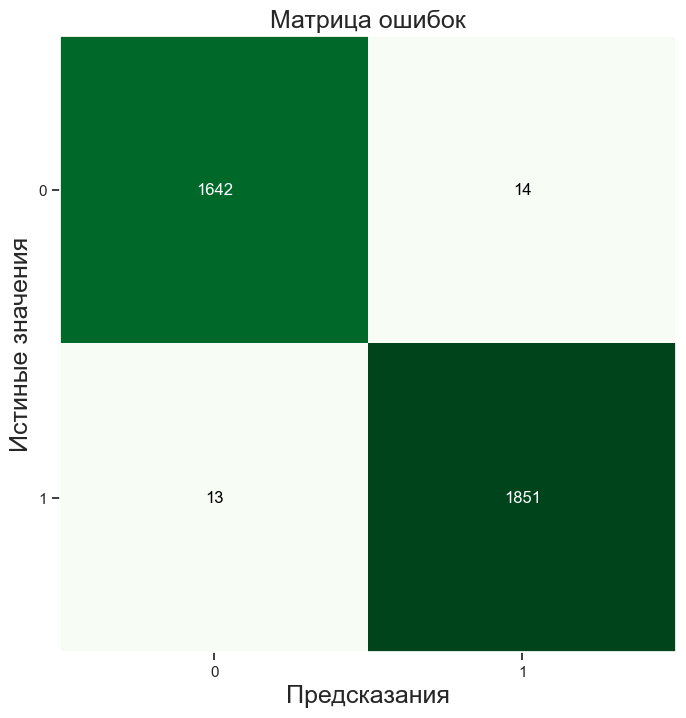

In [44]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Предсказания', fontsize=18)
plt.ylabel('Истиные значения', fontsize=18)
plt.title('Матрица ошибок', fontsize=18)
plt.show()

In [45]:
pd.DataFrame(experiments, columns=['Эксперимент', 'Accuracy', 'F1', 'ROC AUC']).round(4)

,Эксперимент,Accuracy,F1,ROC AUC
0,Байесовский классификатор (baseline),0.9895,0.9901,0.9896
1,Логистическая регрессия (до подбора гиперпарам...,0.9912,0.9917,0.9911
2,Логистическая регрессия (после подбора гиперпа...,0.9923,0.9928,0.9923


## 2. Обучим решающее дерево и подберем для него наилучшие гиперпараметры

In [46]:
dtc_model = DecisionTreeClassifier(random_state=seed)
dtc_model.fit(X_train_scaled, y_train)
y_pred = dtc_model.predict(X_test_scaled)
experiments.append(calc_metrics(y_test, y_pred, 'Решающее дерево (до подбора гиперпараметров)'))

Решающее дерево (до подбора гиперпараметров)
Accuracy: 0.9821
F1 score: 0.9831
ROC AUC: 0.9822


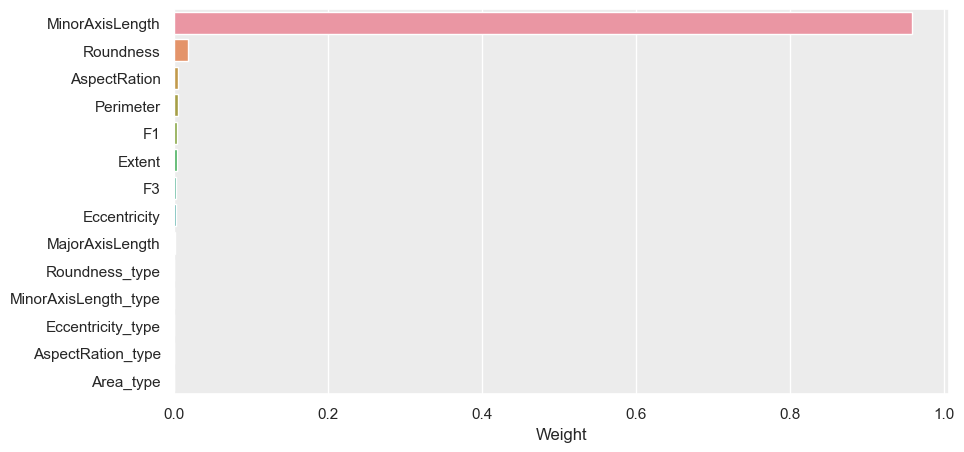

In [47]:
show_weights(X.columns.to_list(), dtc_model.feature_importances_)

In [48]:
dtc_model = DecisionTreeClassifier(random_state=seed)
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=seed)
grid_search_dtc = GridSearchCV(estimator=dtc_model, param_grid=params, cv=cv, n_jobs=-1, verbose=1, scoring = "roc_auc")
grid_search_dtc.fit(X_train_scaled, y_train)

print(grid_search_dtc)
print(f"Best ROC AUC: {grid_search_dtc.best_score_:.4f} using {grid_search_dtc.best_params_}")

Fitting 30 folds for each of 50 candidates, totalling 1500 fits
GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=12341092),
             estimator=DecisionTreeClassifier(random_state=12341092), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='roc_auc', verbose=1)
Best ROC AUC: 0.9981 using {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100}


In [49]:
y_score = grid_search_dtc.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig_hist = px.histogram(x=y_score, 
                        color=y_test, 
                        nbins=50, 
                        labels=dict(color='Истинный класс', x='Предсказанная вероятность класса 1'),
                        title='Гистограмма предсказаний')
fig_hist.show()

In [50]:
df_m = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df_m.index.name = "Порог"
df_m.columns.name = "Rate"

fig_thresh = px.line(
    df_m, title='TPR и FPR для каждого порога',
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

In [51]:
fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC кривая (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(showgrid=False, scaleanchor="x", scaleratio=1)
fig.update_xaxes(showgrid=False, constrain='domain')
fig.show()

In [52]:
y_pred = grid_search_dtc.predict(X_test_scaled)
experiments.append(calc_metrics(y_test, y_pred, 'Решающее дерево (после подбора гиперпараметров)'))

Решающее дерево (после подбора гиперпараметров)
Accuracy: 0.9884
F1 score: 0.9889
ROC AUC: 0.9888


In [53]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      1656
     class 1       1.00      0.98      0.99      1864

    accuracy                           0.99      3520
   macro avg       0.99      0.99      0.99      3520
weighted avg       0.99      0.99      0.99      3520



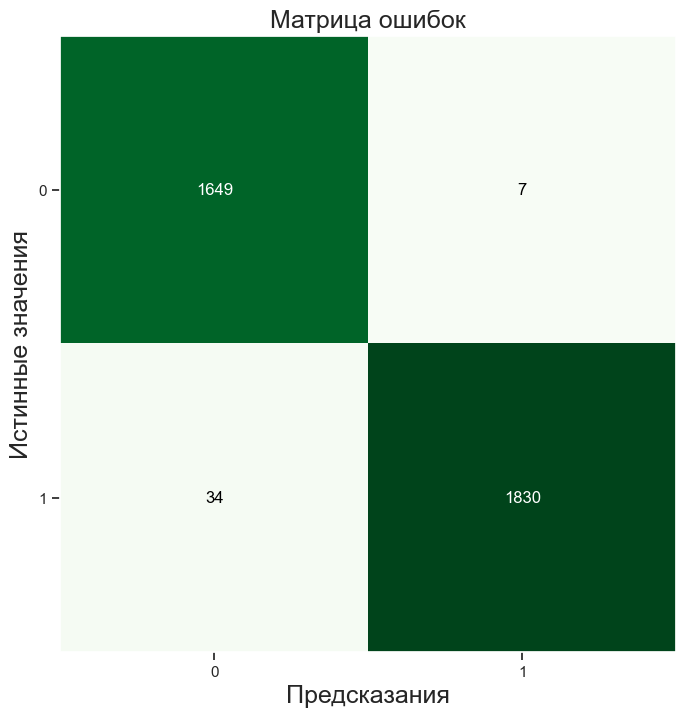

In [54]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Предсказания', fontsize=18)
plt.ylabel('Истинные значения', fontsize=18)
plt.title('Матрица ошибок', fontsize=18)
plt.show()

In [55]:
pd.DataFrame(experiments, columns=['Эксперимент', 'Accuracy', 'F1', 'ROC AUC']).round(4)

,Эксперимент,Accuracy,F1,ROC AUC
0,Байесовский классификатор (baseline),0.9895,0.9901,0.9896
1,Логистическая регрессия (до подбора гиперпарам...,0.9912,0.9917,0.9911
2,Логистическая регрессия (после подбора гиперпа...,0.9923,0.9928,0.9923
3,Решающее дерево (до подбора гиперпараметров),0.9821,0.9831,0.9822
4,Решающее дерево (после подбора гиперпараметров),0.9884,0.9889,0.9888


## Обучим случайный лес и подберем для него наилучшие гиперпараметры.

In [56]:
rfc_model = RandomForestClassifier(random_state=seed)
rfc_model.fit(X_train_scaled, y_train)
y_pred = rfc_model.predict(X_test_scaled)
experiments.append(calc_metrics(y_test, y_pred, 'Случайный лес (до подбора гиперпараметров)'))

Случайный лес (до подбора гиперпараметров)
Accuracy: 0.9915
F1 score: 0.9920
ROC AUC: 0.9913


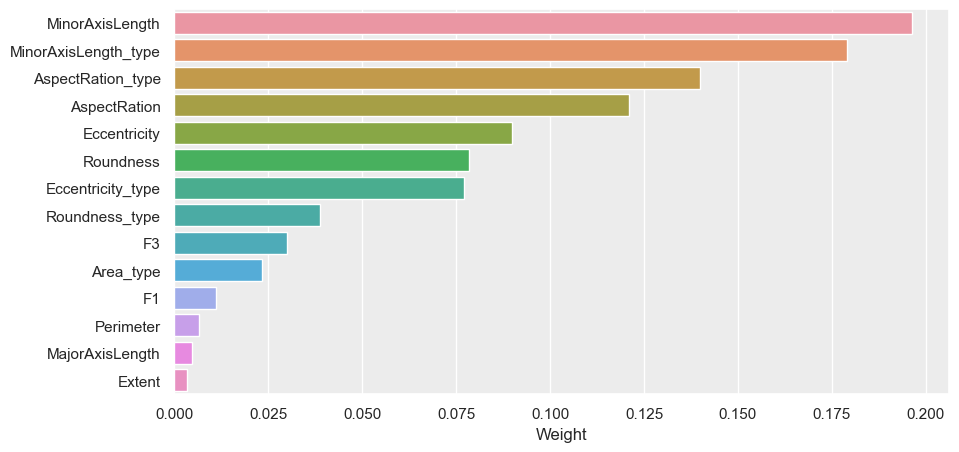

In [57]:
show_weights(X.columns.to_list(), rfc_model.feature_importances_)

In [58]:
rfc_model = RandomForestClassifier(random_state=seed)
params = {
    'n_estimators' : [10, 100, 1000],
    'max_features' : ['sqrt', 'log2']
}
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=seed)
grid_search_rfc = GridSearchCV(estimator=rfc_model, param_grid=params, cv=cv, n_jobs=-1, verbose=1, scoring = "roc_auc")
grid_search_rfc.fit(X_train_scaled, y_train)

print(grid_search_rfc)
print(f"Best ROC AUC: {grid_search_rfc.best_score_:.4f} using {grid_search_rfc.best_params_}")

Fitting 30 folds for each of 6 candidates, totalling 180 fits
GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=12341092),
             estimator=RandomForestClassifier(random_state=12341092), n_jobs=-1,
             param_grid={'max_features': ['sqrt', 'log2'],
                         'n_estimators': [10, 100, 1000]},
             scoring='roc_auc', verbose=1)
Best ROC AUC: 0.9982 using {'max_features': 'sqrt', 'n_estimators': 1000}


In [59]:
y_score = grid_search_rfc.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig_hist = px.histogram(x=y_score,
                        color=y_test,
                        nbins=50,
                        labels=dict(color='Истинный класс', x='Предсказанная вероятность класса 1'),
                        title='Гистограмма предсказаний')
fig_hist.show()

In [60]:
df_m = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df_m.index.name = "Порог"
df_m.columns.name = "Rate"

fig_thresh = px.line(
    df_m, title='TPR и FPR для каждого порога',
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

In [61]:
fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(showgrid=False,scaleanchor="x", scaleratio=1)
fig.update_xaxes(showgrid=False,constrain='domain')
fig.show()

In [62]:
y_pred = grid_search_rfc.predict(X_test_scaled)
experiments.append(calc_metrics(y_test, y_pred, 'Случайный лес (после подбора гиперпараметров)'))

Случайный лес (после подбора гиперпараметров)
Accuracy: 0.9912
F1 score: 0.9917
ROC AUC: 0.9910


In [63]:
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.99      0.99      1656
     class 1       0.99      0.99      0.99      1864

    accuracy                           0.99      3520
   macro avg       0.99      0.99      0.99      3520
weighted avg       0.99      0.99      0.99      3520



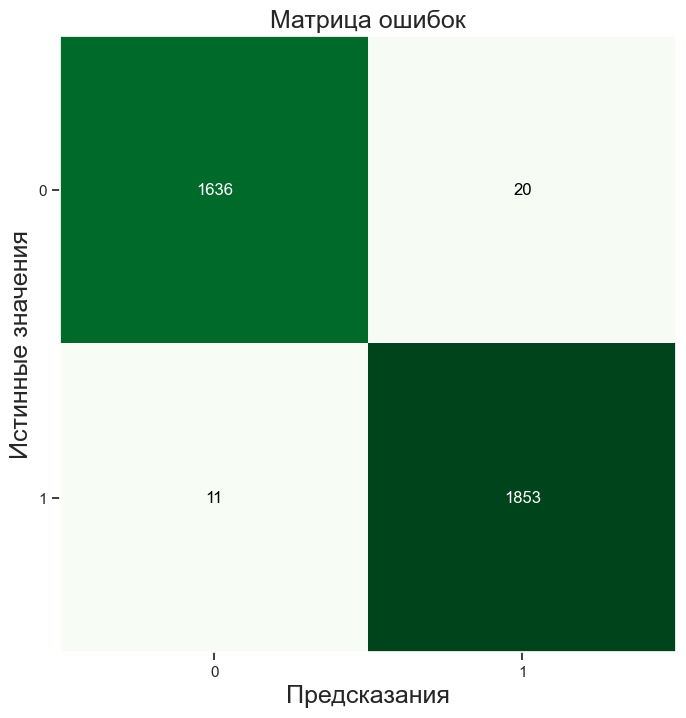

In [64]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Предсказания', fontsize=18)
plt.ylabel('Истинные значения', fontsize=18)
plt.title('Матрица ошибок', fontsize=18)
plt.show()

# Выводы

## Отсортируем все эксперименты по ROC AUC

In [65]:
pd.DataFrame(experiments, columns=['Эксперимент', 'Accuracy', 'F1', 'ROC AUC']).\
sort_values(by=['ROC AUC'], ascending=False).\
reset_index(drop=True).\
round(4)

,Эксперимент,Accuracy,F1,ROC AUC
0,Логистическая регрессия (после подбора гиперпа...,0.9923,0.9928,0.9923
1,Случайный лес (до подбора гиперпараметров),0.9915,0.9920,0.9913
2,Логистическая регрессия (до подбора гиперпарам...,0.9912,0.9917,0.9911
3,Случайный лес (после подбора гиперпараметров),0.9912,0.9917,0.9910
4,Байесовский классификатор (baseline),0.9895,0.9901,0.9896
5,Решающее дерево (после подбора гиперпараметров),0.9884,0.9889,0.9888
6,Решающее дерево (до подбора гиперпараметров),0.9821,0.9831,0.9822


### Наилучшее качество ROC AUC (а также F1 и Accuracy) продемонстрировала модель логистической регрессии. Следом идет случайный лес и решающее дерево. При этом решающее дерево оказалось даже хуже бейзлайна (байесовский классификатор).